# Deterministic Surface Water Prediction

This notebook demonstrates **deterministic surface water prediction** using a trained deep learning model.

Unlike the previous notebook, which focuses on Monte Carlo dropout and uncertainty analysis, this notebook performs:

- Standard model inference
- Random sampling of test patches
- Visual comparison between:
  - Input imagery
  - Reference water masks
  - Predicted water masks

This notebook is intended for **quick qualitative inspection** of model performance.


## 1. Import libraries

This section imports the required Python packages and project modules.

Since the `src/` directory is located in the parent folder, we add the project root to the Python path to ensure correct imports.


In [ ]:
import sys
from pathlib import Path

# Add project root to Python path
PROJECT_ROOT = Path("..").resolve()
sys.path.append(str(PROJECT_ROOT))

# Standard libraries
import torch
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from torch import optim
import ipywidgets as widgets
from IPython.display import display
import io

# Project modules
from src.logger.logger import create_logger
from src.dataset.dataset import get_dataloader, SegDataset
from src.models.unet import UNet
from src.models.unet_plus import UNetPlusPlus
from src.train import criterion, get_metrics, get_device


## 2. Define model directory

We list all available trained model checkpoints stored in the `models/` directory and allow the user to select one interactively.


In [ ]:
MODELS_DIR = PROJECT_ROOT / "models"

models_paths = [
    model.name
    for model in MODELS_DIR.iterdir()
    if model.is_file() and not model.name.startswith(".")
]
models_paths.sort()

model_select = widgets.Dropdown(
    options=models_paths,
    description="Select Model:",
    style={"description_width": "initial"},
)
display(model_select)


## 3. Determine dataset configuration

The dataset type and normalization scheme are inferred from the selected model name.


In [ ]:
n_parts = model_select.value.split("_")
DATASET = n_parts[0]
DATASET_TYPE = n_parts[1] + "_" + n_parts[2]

selected_model = MODELS_DIR / model_select.value

TEST_PATH = PROJECT_ROOT / f"data/patches/{DATASET}/{DATASET_TYPE}/test"

print("Test path:", TEST_PATH)
print("Dataset:", DATASET)
print("Dataset type:", DATASET_TYPE)
print("Model:", selected_model)


## 4. Select model architecture

Choose the neural network architecture corresponding to the selected checkpoint.


In [ ]:
model_type = widgets.Dropdown(
    options=["unet", "unet++"],
    description="Select model type:",
)
display(model_type)


## 5. Load the trained model

The selected checkpoint is loaded and the corresponding model architecture is initialized.


In [ ]:
device = get_device()
model_type_value = model_type.value

n_channels = 5  # number of input channels (e.g., Sentinel-2 + slope)

with open(selected_model, "rb") as f:
    buffer = io.BytesIO(f.read())
    model_weights = torch.load(buffer, map_location=device)

    if model_type_value == "unet":
        net = UNet(in_channels=n_channels, out_channels=1).to(device)
        net.load_state_dict(model_weights)
    else:
        net = UNetPlusPlus(in_channels=n_channels, out_channels=1).to(device)
        net.load_state_dict(model_weights, strict=False)


## 6. Load test dataset

We load the test patches corresponding to the selected dataset configuration.


In [ ]:
test_dataset = SegDataset(
    DATASET,
    TEST_PATH,
    transform=None,
    slope=True,
    s1_ratio=False,
)

print("Number of test samples:", len(test_dataset))


## 7. Deterministic predictions on random test patches

For a set of randomly selected test patches:

1. Load the input image
2. Run the trained model
3. Apply a probability threshold
4. Visualize:
   - Input image band
   - Reference mask
   - Predicted mask

This allows quick qualitative inspection of model performance.


955
839


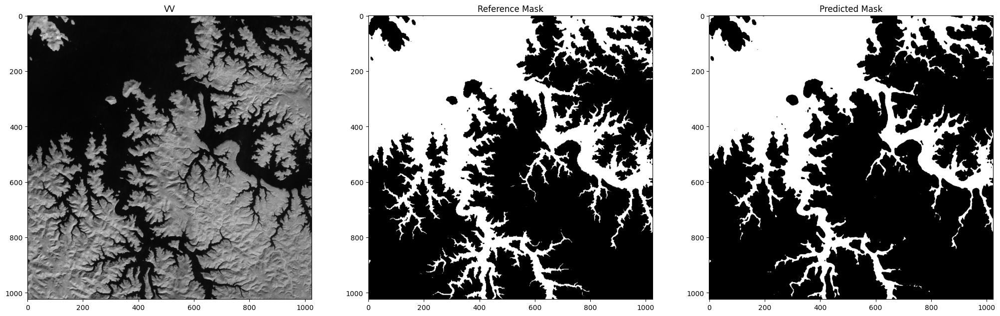

622


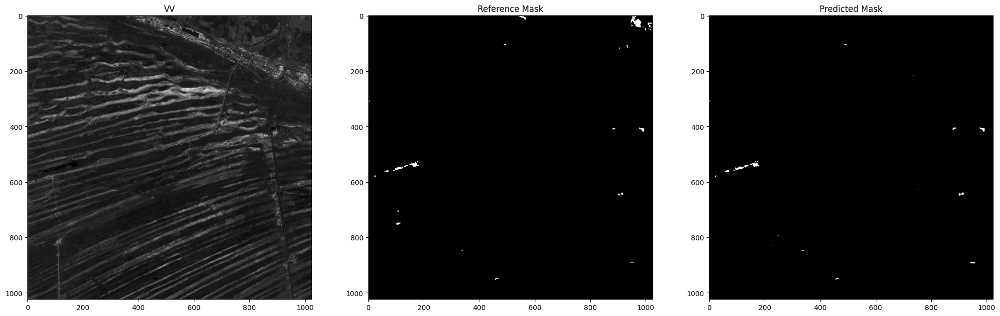

125


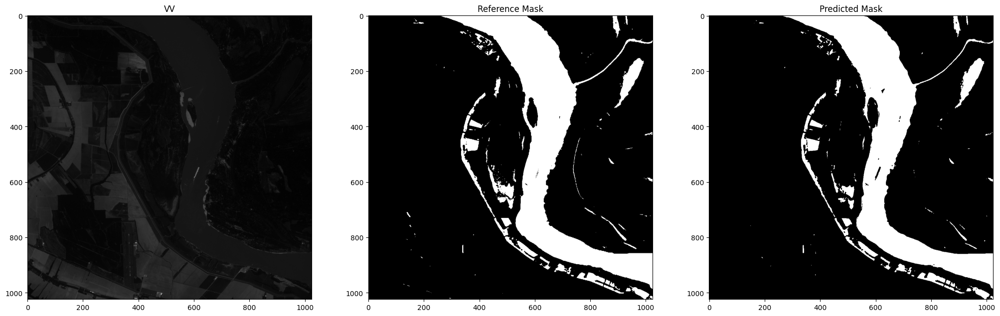

648


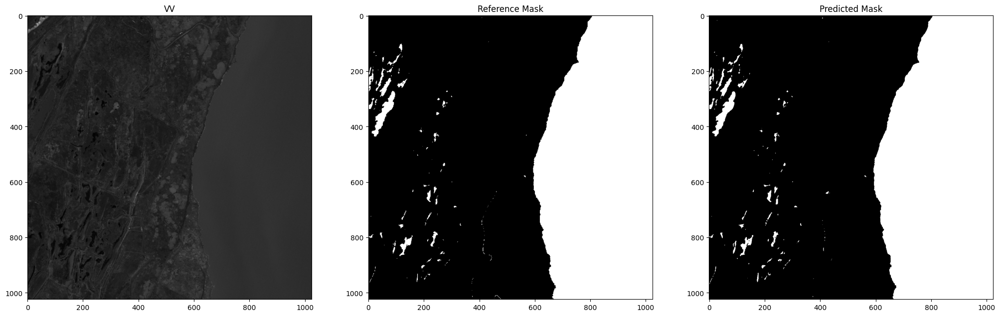

810


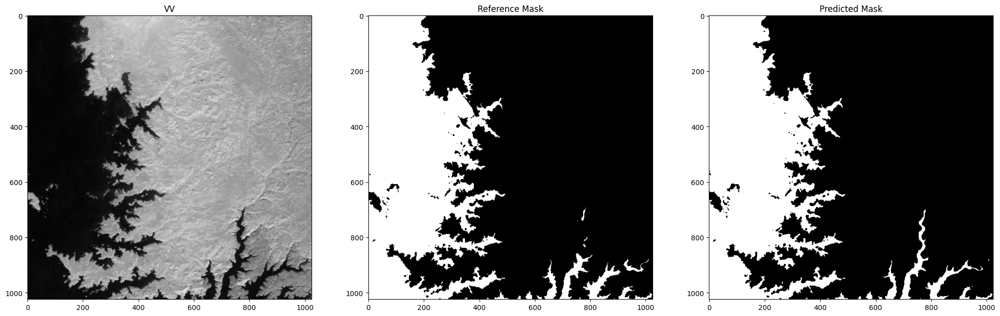

361


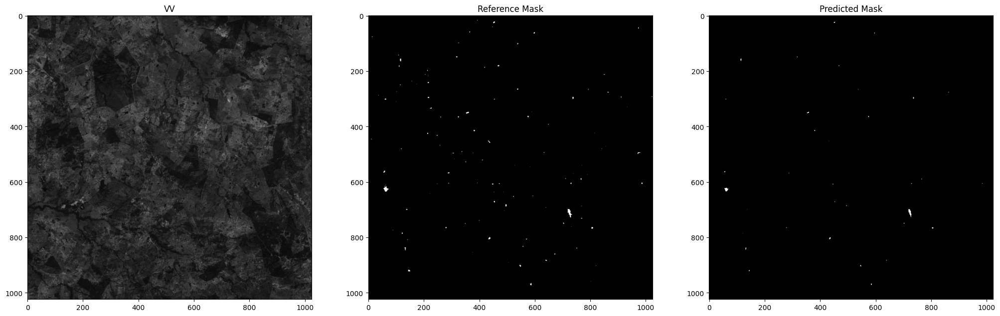

179


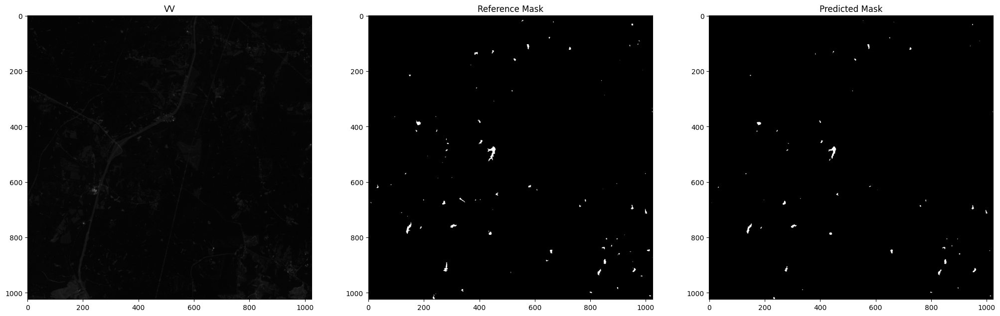

355


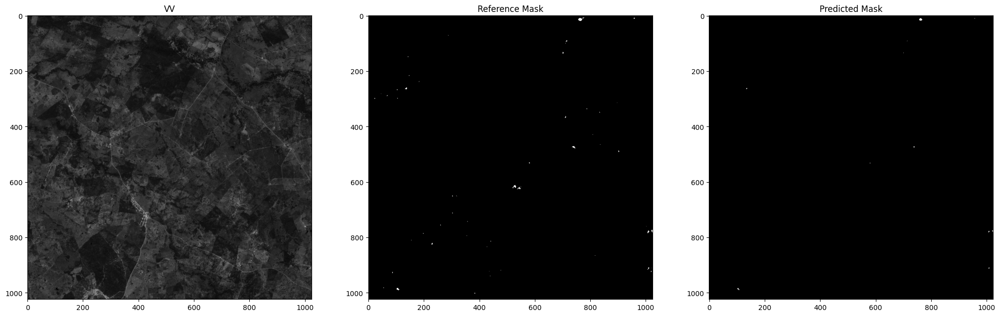

374


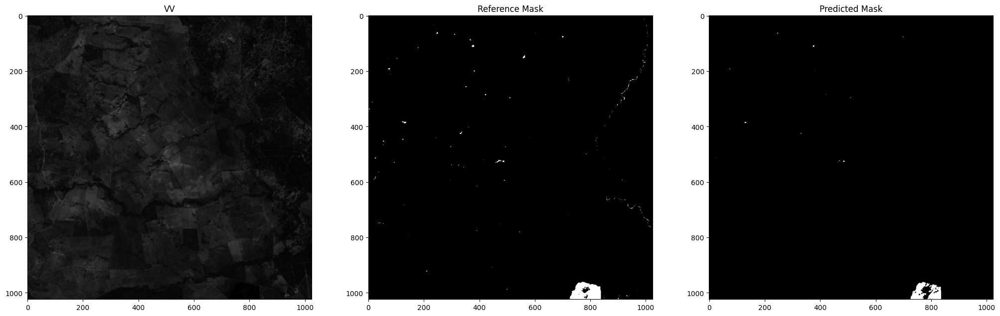

612


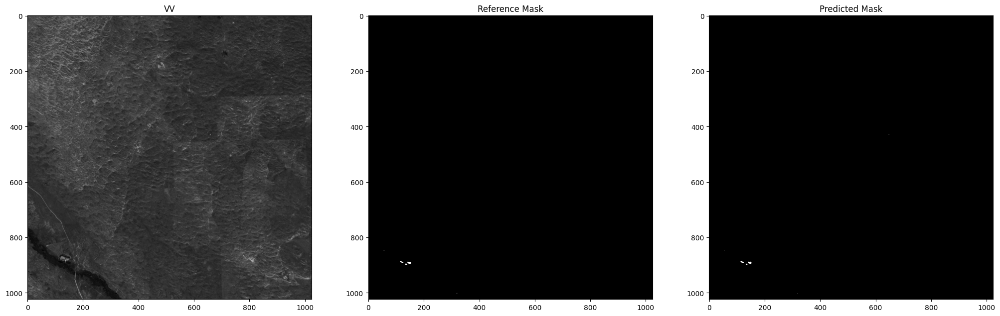

641


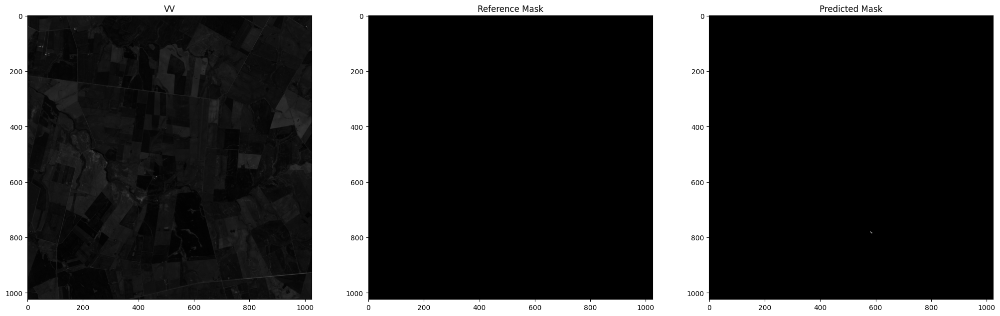

199


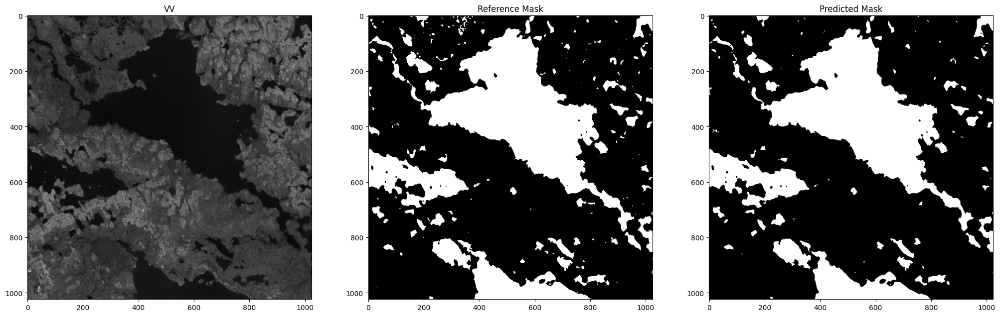

54


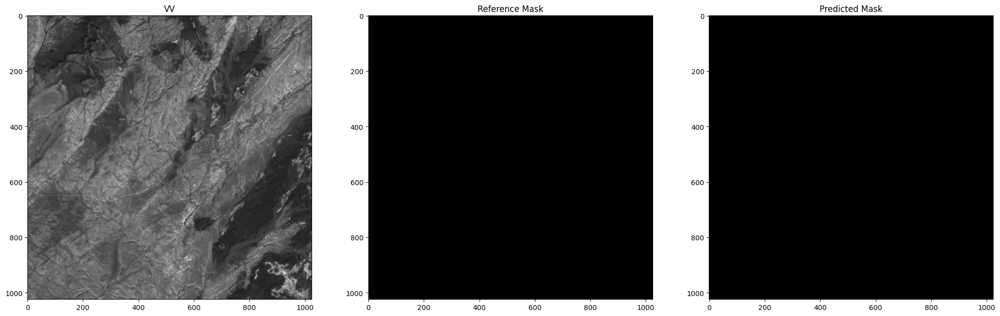

152


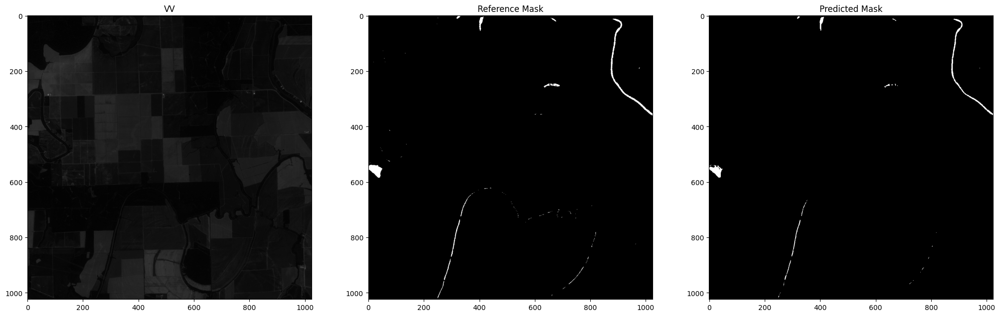

771


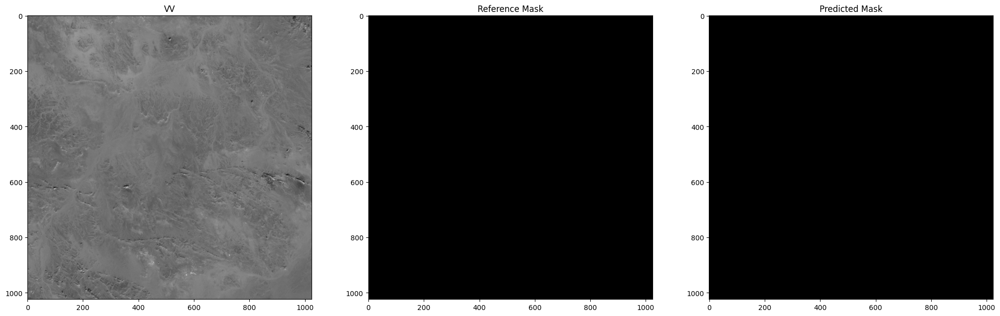

3


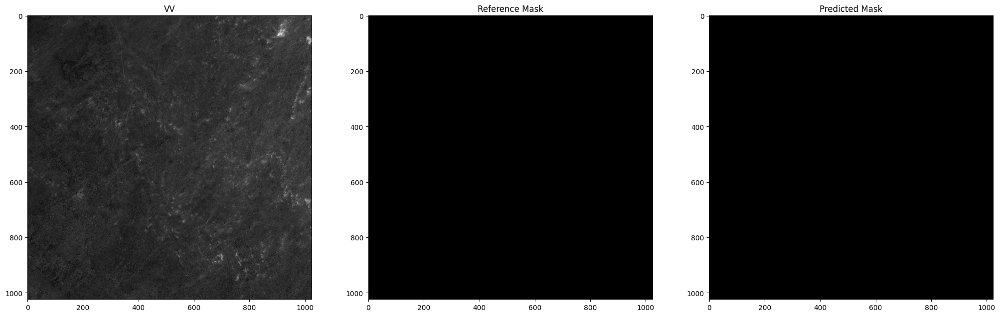

790


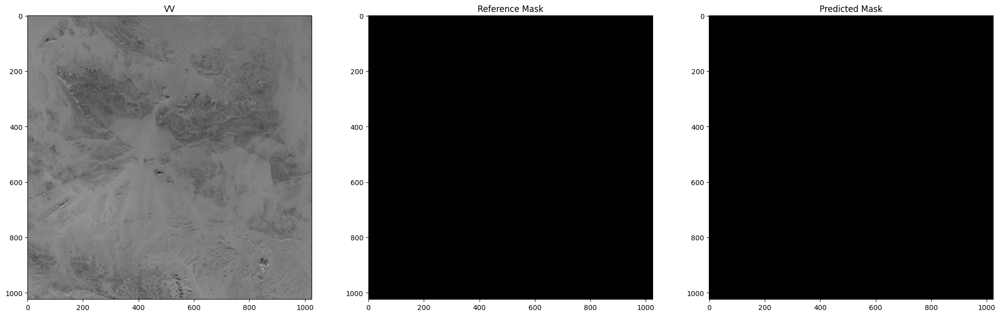

396


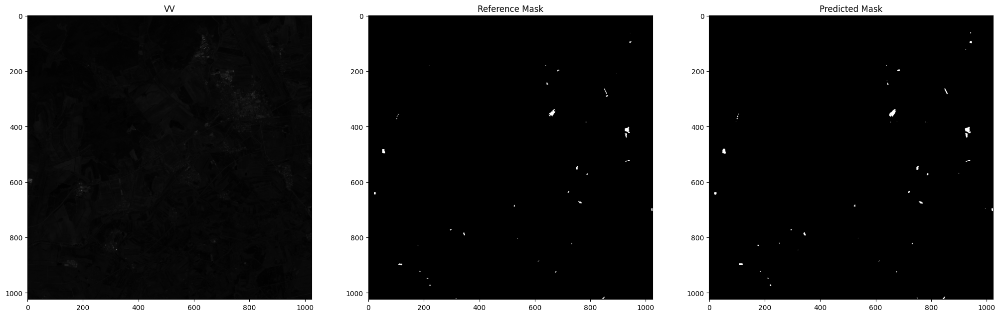

159


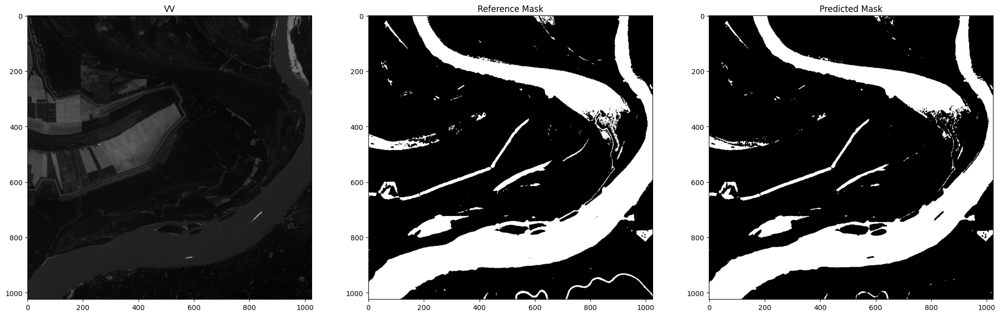

717


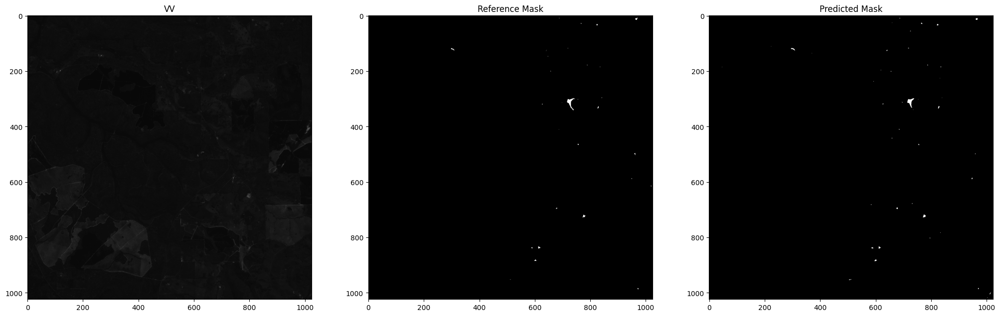

478


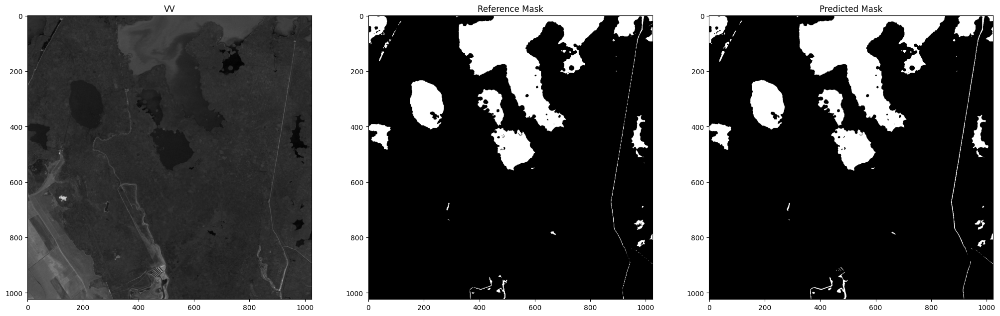

90


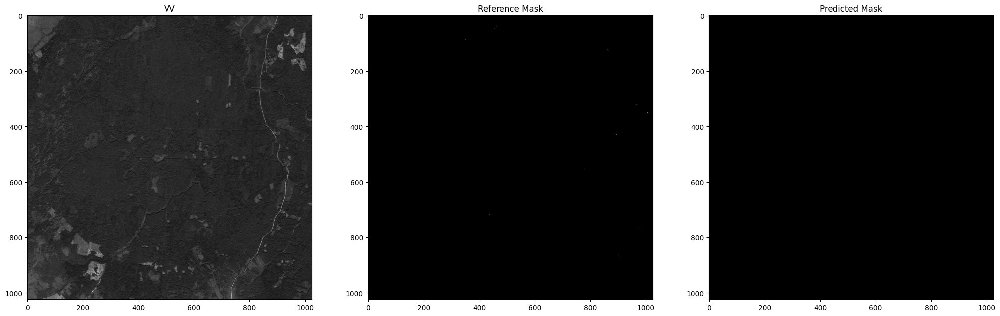

222


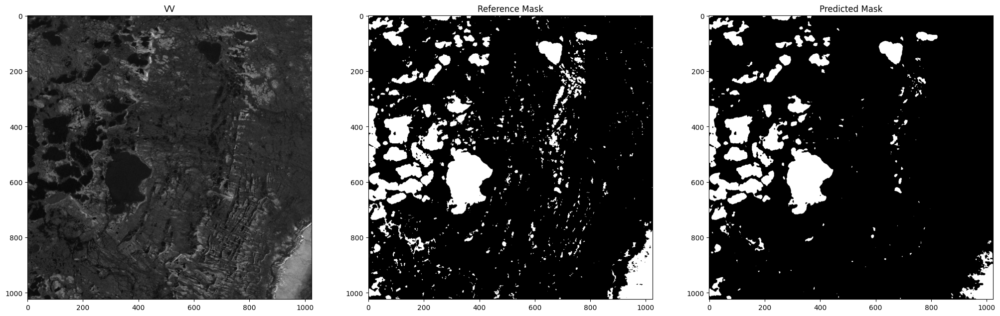

681


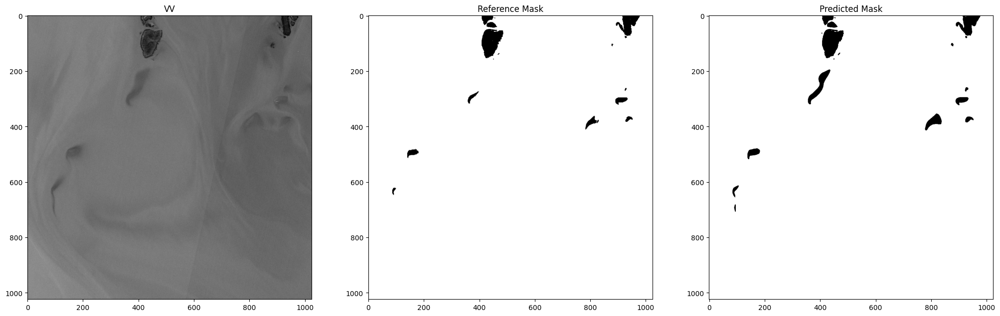

305


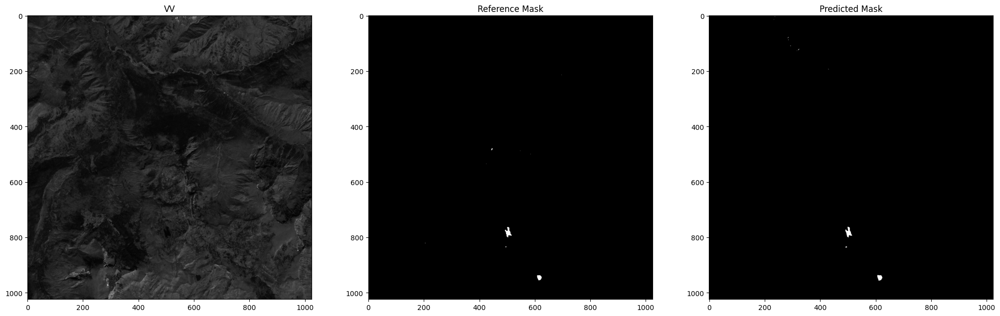

In [ ]:
for i in range(25):
    rand_indx = np.random.randint(0,len(test_dataset))
    print(rand_indx)
    img, mask = test_dataset[rand_indx]
    #print(img.shape, mask.shape)
    in_img = img[0:n_channels,:,:].unsqueeze(0)
    in_img = in_img.to(device, dtype=torch.float32)
    net.eval()
    logits = net(in_img)
    prediction = (torch.sigmoid(logits) > 0.60).float()
    pred_mask = prediction[0].squeeze(0)
    pred_mask = pred_mask.cpu().detach().numpy()
    fig, ax = plt.subplots(1, 3, figsize=(25, 25))
    #green = img.permute(1,2,0)[...,[1]]
    #nir = img.permute(1,2,0)[...,[3]]
    #ndwi = (green - nir) / (green + nir)
    #ndwi_thresholded = (ndwi > 0.2)
    
    ax[0].imshow(img.permute(1, 2, 0)[..., [0]] , cmap="gray")
    ax[0].set_title("VV")
    ax[1].imshow(mask, cmap="gray")
    ax[1].set_title("Reference Mask")
    #ax[3].imshow(ndwi_thresholded, cmap="grey")
    #ax[3].set_title("NDWI")
    ax[2].imshow(pred_mask, cmap="gray")
    ax[2].set_title("Predicted Mask")
    plt.show()
